In [1]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

TF version: 2.5.0
TF Hub version: 0.12.0


In [2]:
import os
import pandas as pd
import numpy as np

In [3]:
labels_csv = pd.read_csv("Dog_vs_cat/Dog_vs_cat.csv")


labels_csv.drop('Unnamed: 0',axis=1, inplace=True)



In [4]:
labels_csv.head()

,filename,category
0,dog.9594.jpg,1
1,dog.9601.jpg,1
2,dog.9595.jpg,1
3,dog.9596.jpg,1
4,dog.96.jpg,1


In [5]:
labels_csv = labels_csv.sample(frac = 1)
labels_csv

,filename,category
7641,dog.3232.jpg,1
5161,dog.5129.jpg,1
21233,cat.1881.jpg,0
2747,dog.7915.jpg,1
19876,cat.3148.jpg,0
...,...,...
10687,dog.11421.jpg,1
11888,dog.10851.jpg,1
4019,dog.6578.jpg,1
13332,cat.8845.jpg,0


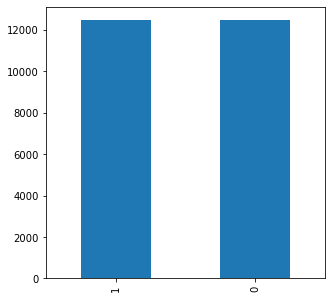

In [6]:
# How many images are there of each breed?
import matplotlib.pyplot as plt
labels_csv["category"].value_counts().plot.bar(figsize=(5, 5));

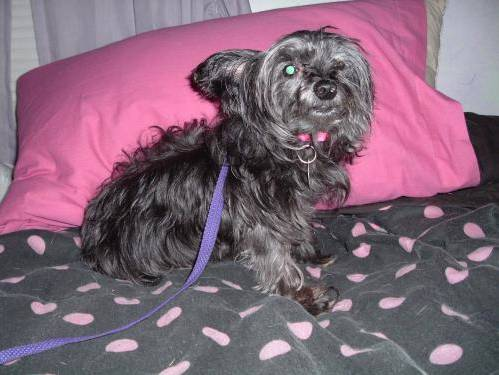

In [7]:
# Let's view an image
from IPython.display import Image
Image("Dog_vs_cat/train/dog.0.jpg")

In [8]:
# Create pathnames from image ID's
filenames = ["Dog_vs_cat/train/" + fname for fname in labels_csv["filename"]]

# Check the first 15
filenames[:15]

['Dog_vs_cat/train/dog.3232.jpg',
 'Dog_vs_cat/train/dog.5129.jpg',
 'Dog_vs_cat/train/cat.1881.jpg',
 'Dog_vs_cat/train/dog.7915.jpg',
 'Dog_vs_cat/train/cat.3148.jpg',
 'Dog_vs_cat/train/cat.1917.jpg',
 'Dog_vs_cat/train/cat.9404.jpg',
 'Dog_vs_cat/train/dog.5823.jpg',
 'Dog_vs_cat/train/dog.4602.jpg',
 'Dog_vs_cat/train/cat.8759.jpg',
 'Dog_vs_cat/train/dog.6872.jpg',
 'Dog_vs_cat/train/cat.934.jpg',
 'Dog_vs_cat/train/cat.2966.jpg',
 'Dog_vs_cat/train/cat.3633.jpg',
 'Dog_vs_cat/train/cat.7443.jpg']

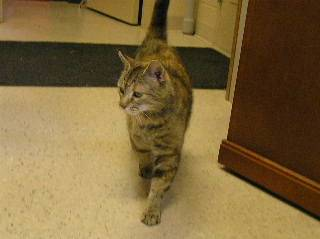

In [9]:
Image(filenames[16])

In [10]:
labels_csv["category"][2375]

1

In [11]:
import numpy as np
labels = labels_csv["category"].to_numpy() 
labels

array([1, 1, 0, ..., 1, 0, 1], dtype=int64)

In [12]:
len(labels)

25000

In [13]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
    print("labels matches number of filenames!")
else:
    print("labels does not match number of filenames")

labels matches number of filenames!


In [14]:
# Find the unique label values
unique_category = np.unique(labels)
len(unique_category)

2

In [15]:
unique_category

array([0, 1], dtype=int64)

In [16]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_category

1


array([False,  True])

In [17]:
# Turn every label into a boolean array
boolean_labels = [label == unique_category for label in labels]
boolean_labels[:2]

[array([False,  True]), array([False,  True])]

In [18]:
len(boolean_labels)

25000

In [19]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_category == labels[0]))
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

1
(array([1], dtype=int64),)
1
[0 1]


In [20]:
filenames[:10]

['Dog_vs_cat/train/dog.3232.jpg',
 'Dog_vs_cat/train/dog.5129.jpg',
 'Dog_vs_cat/train/cat.1881.jpg',
 'Dog_vs_cat/train/dog.7915.jpg',
 'Dog_vs_cat/train/cat.3148.jpg',
 'Dog_vs_cat/train/cat.1917.jpg',
 'Dog_vs_cat/train/cat.9404.jpg',
 'Dog_vs_cat/train/dog.5823.jpg',
 'Dog_vs_cat/train/dog.4602.jpg',
 'Dog_vs_cat/train/cat.8759.jpg']

In [21]:
# Setup X & y variables

X = filenames
y = boolean_labels

In [22]:
# Let's split data
from sklearn.model_selection import train_test_split

# Into train and valid 
X_train, X_val, y_train, y_val = train_test_split(X,
                                                  y, 
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(X_val), len(y_train), len(y_val)

(20000, 5000, 20000, 5000)

In [23]:
# Let's show data
X_train[:5],y_train[:5]

(['Dog_vs_cat/train/dog.3419.jpg',
  'Dog_vs_cat/train/cat.9046.jpg',
  'Dog_vs_cat/train/dog.11562.jpg',
  'Dog_vs_cat/train/cat.8327.jpg',
  'Dog_vs_cat/train/cat.11325.jpg'],
 [array([False,  True]),
  array([ True, False]),
  array([False,  True]),
  array([ True, False]),
  array([ True, False])])

In [24]:
# Convert images to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[0])
image.shape

(200, 146, 3)

In [25]:
# Convert in to tensor by tf.constant
tf.constant(image)

<tf.Tensor: shape=(200, 146, 3), dtype=uint8, numpy=
array([[[137, 123,  86],
        [137, 124,  82],
        [136, 123,  78],
        ...,
        [116, 102,  55],
        [115, 102,  57],
        [115, 102,  57]],

       [[137, 123,  86],
        [137, 124,  82],
        [136, 123,  78],
        ...,
        [116, 102,  53],
        [115, 102,  57],
        [115, 102,  57]],

       [[137, 123,  86],
        [137, 124,  82],
        [136, 123,  78],
        ...,
        [118, 102,  53],
        [115, 103,  55],
        [115, 103,  55]],

       ...,

       [[ 54,  56,  35],
        [ 56,  58,  37],
        [ 54,  56,  35],
        ...,
        [ 81,  77,  50],
        [ 85,  81,  52],
        [ 83,  79,  50]],

       [[ 56,  58,  37],
        [ 59,  61,  40],
        [ 57,  59,  38],
        ...,
        [ 64,  60,  33],
        [ 79,  75,  46],
        [ 79,  75,  46]],

       [[ 46,  48,  27],
        [ 52,  54,  33],
        [ 52,  54,  33],
        ...,
        [ 79,  75,  4


TURNING IMAGES INTO TENSOR

A Function for Preprocessing images:

    Take an image filepath as input
    Use Tensorflow to read the file and save it to a variable image
    Turn our image into Tensors
    Normalize our image
    Resize the images to be a shape of (224,224)
    Return the modified images



In [26]:
# Define image size
IMG_SIZE = 224

# Function
def process_image(image_path, image_size=IMG_SIZE):
    """
    Takes an image file path and turns the image into a Tensor.
    """
    # Read in an image file
    image = tf.io.read_file(image_path)
    # Turn the jpg image into numerical Tensor with 3 colour channel(RGB)
    image = tf.image.decode_jpeg(image,channels=3)
    # Convert the color channel values to (0-1) values
    image = tf.image.convert_image_dtype(image,tf.float32)
    # Resize the image to (224,224)
    image = tf.image.resize(image, size=[image_size,image_size])

    return image

In [27]:
# Create a function to return a tuple (image, label)
def get_image_lable(image_path,label):
    """
    Takes an image file path name and the label,
    processes the image and return a tuple (image, label).
    """
    image = process_image(image_path)

    return image,label

In [28]:
# Define the batch size
BATCH_SIZE = 32

# Function to convert data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE,valid_data=False):
    """
    Creates batches of data of image (X) and label (y) pairs.
    Shuffle the data if it's training data but doesn't shuffle if it's validation data.
    """
    # If data is valid dataset (NO SHUFFLE)
    if valid_data:
        print("Creating valid data batches.........")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                   tf.constant(y)))
        data_batch = data.map(get_image_lable).batch(batch_size)
        
        return data_batch

    else:
        print("Creating train data batches.........")
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                   tf.constant(y)))
        # Shuffling pathname and labels before mapping image processor fun
        data = data.shuffle(buffer_size=len(X))
        data_batch = data.map(get_image_lable).batch(batch_size)

        return data_batch

In [29]:
# Creat training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating train data batches.........
Creating valid data batches.........


In [30]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 2), dtype=tf.bool, name=None)))

In [31]:
import matplotlib.pyplot as plt
# Create fun for viewing in a data batch
def show_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch.
    """
    plt.figure(figsize=(20, 20))
    for i in range(25):
        # Subplot
        ax = plt.subplot(5,5,i+1)
        plt.imshow(images[i])
        plt.title(unique_category[labels[i].argmax()])
        plt.axis("Off")


In [32]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.09154772, 0.09939086, 0.04529781],
          [0.05609915, 0.0639423 , 0.02080504],
          [0.13305323, 0.14905463, 0.08986297],
          ...,
          [0.25572363, 0.12302051, 0.07627679],
          [0.32378122, 0.17476161, 0.12378122],
          [0.3225944 , 0.17357479, 0.12259439]],
 
         [[0.19798   , 0.20582314, 0.1548643 ],
          [0.0807237 , 0.08523784, 0.05208755],
          [0.09137046, 0.10735437, 0.05061416],
          ...,
          [0.26857808, 0.13587496, 0.08913125],
          [0.31550178, 0.16648217, 0.11550178],
          [0.35514992, 0.20613033, 0.15514992]],
 
         [[0.05817953, 0.06602267, 0.037553  ],
          [0.08733416, 0.09125573, 0.06436779],
          [0.07332043, 0.08540025, 0.04565935],
          ...,
          [0.28662962, 0.15435132, 0.10760762],
          [0.31682166, 0.16780207, 0.11682168],
          [0.39502838, 0.24600877, 0.19502838]],
 
         ...,
 
         [[0.55289197, 0.5097547 , 0.2539424 ],
          [0.68471

In [33]:
len(train_images), len(train_labels)

(32, 32)

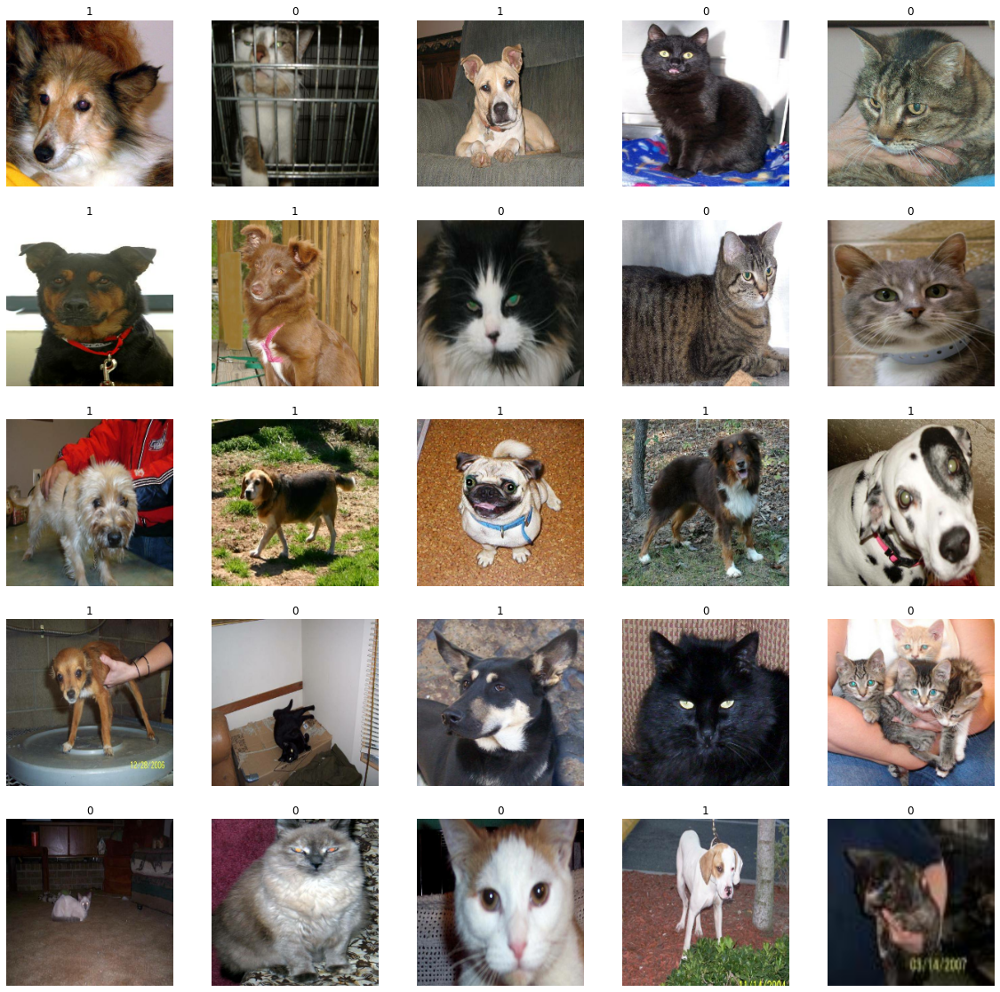

In [34]:
# let's show data
train_images, train_labels = next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)

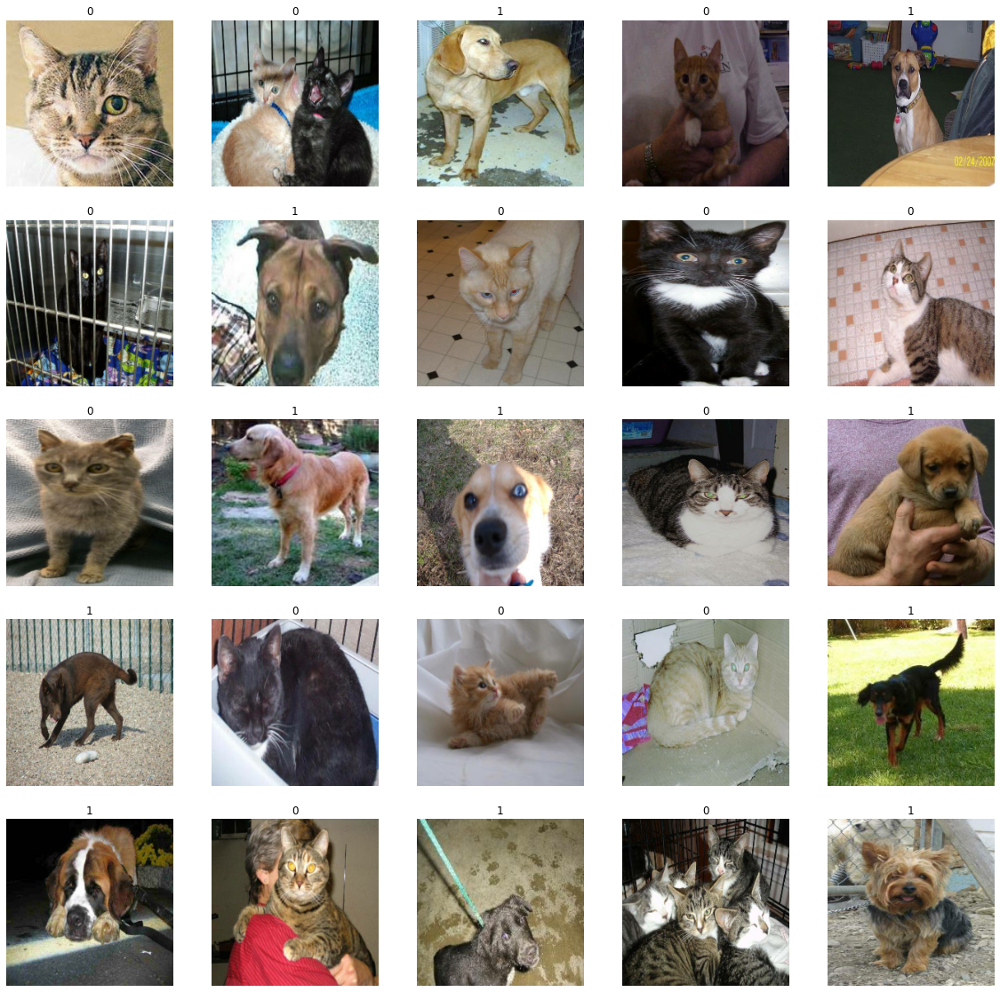

In [35]:
# For valid data
val_images, val_labels = next(val_data.as_numpy_iterator())
show_images(val_images, val_labels)


Building a model

Before we build a model--->

    The input shape.
    The output shape.
    The URL of the model we want to use.



In [36]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, Colour_chanels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_category)

# Setup model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [37]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Flatten,Dense,Dropout,Conv2D,MaxPool2D,BatchNormalization,GlobalAveragePooling2D
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

In [38]:
# Create a fun to build a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model
    mobileNet=MobileNetV2(weights="imagenet",include_top=False,input_shape=(IMG_SIZE, IMG_SIZE, 3))

    for l in mobileNet.layers:
        l.trainable=False
        
    model=Sequential()
    model.add(mobileNet)
    model.add(Conv2D(32,3,activation='relu'))
    model.add(Dropout(0.2))
    model.add(GlobalAveragePooling2D())
    model.add(Dense(2,activation="softmax"))
        
    # Compile the model
    model.compile(
      loss = tf.keras.losses.BinaryCrossentropy(),optimizer = tf.keras.optimizers.Adam(),metrics = ["accuracy"])

    # Build the model
    model.build(input_shape)

    return model

In [39]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
mobilenetv2_1.00_224 (Functi (None, 7, 7, 1280)        2257984   
_________________________________________________________________
conv2d (Conv2D)              (None, 5, 5, 32)          368672    
_________________________________________________________________
dropout (Dropout)            (None, 5, 5, 32)          0         
_________________________________________________________________
global_average_pooling2d (Gl (None, 32)                0         
_________________________________________________________________
dense (Dense)                (None, 2)                 66        
Total params: 2,626,722
Trainable params: 368,738
Non-trainable params: 2,257,984
_________________________________________________________________



Creating callbacks

TesnorBoard Callback

In [40]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [41]:
import datetime
import os
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    logdir = os.path.join("Dog_vs_cat/log",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  
    return tf.keras.callbacks.TensorBoard(logdir)

In [42]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience = 3)

In [43]:
NUM_EPOCHS = 30

In [44]:
# Check to make sure we're still running on a GPU
print("GPU is on" if tf.config.list_physical_devices("GPU") else "No GPU :(")

GPU is on


In [45]:
# Build a function to train and return a trained model
def train_model():
    tensorboard = create_tensorboard_callback()

    # Fit the model
    model.fit(x=train_data,
            epochs= NUM_EPOCHS,
            validation_data=val_data,
            validation_freq = 1,
            callbacks = [tensorboard,early_stopping])
    
    return model

In [46]:
# Fit the data
model = train_model()

C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 1/30
625/625 [==============================] - 289s 449ms/step - loss: 0.0642 - accuracy: 0.9777 - val_loss: 0.0663 - val_accuracy: 0.9738
Epoch 2/30
625/625 [==============================] - 52s 83ms/step - loss: 0.0363 - accuracy: 0.9861 - val_loss: 0.0473 - val_accuracy: 0.9834
Epoch 3/30
625/625 [==============================] - 52s 83ms/step - loss: 0.0276 - accuracy: 0.9893 - val_loss: 0.0402 - val_accuracy: 0.9854
Epoch 4/30
625/625 [==============================] - 54s 87ms/step - loss: 0.0221 - accuracy: 0.9910 - val_loss: 0.0726 - val_accuracy: 0.9806
Epoch 5/30
625/625 [==============================] - 57s 91ms/step - loss: 0.0174 - accuracy: 0.9930 - val_loss: 0.0508 - val_accuracy: 0.9846
Epoch 6/30
625/625 [==============================] - 54s 86ms/step - loss: 0.0140 - accuracy: 0.9941 - val_loss: 0.0555 - val_accuracy: 0.9864
Epoch 7/30
625/625 [==============================] - 54s 86ms/step - loss: 0.0102 - accuracy: 0.9956 - val_loss: 0.0758 - val_accurac

In [47]:
%tensorboard --logdir /log

In [48]:
# Make prediction on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

157/157 [==============================] - 10s 57ms/step


array([[1.00000000e+00, 1.21625366e-20],
       [1.00000000e+00, 3.49771626e-21],
       [9.66924364e-25, 1.00000000e+00],
       ...,
       [1.00000000e+00, 3.59737940e-21],
       [9.83957003e-36, 1.00000000e+00],
       [3.83227298e-19, 1.00000000e+00]], dtype=float32)

In [49]:
predictions.shape

(5000, 2)

In [50]:
np.sum(predictions[0])

1.0

In [51]:
def make_prediction(prediction_probabilities):
    """
    Turns an array of prediction probabilities into a label.
    """

    return unique_category[np.argmax(prediction_probabilities)]

In [52]:
pred_label = make_prediction(predictions[17])
pred_label

0

In [53]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 2)), types: (tf.float32, tf.bool)>

In [54]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
    of images and labels.
    """
    images = []
    labels = []
    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_category[np.argmax(label)])
    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.7843138 , 0.69803923, 0.5137255 ],
         [0.8071692 , 0.72089463, 0.5365809 ],
         [0.8174195 , 0.73114496, 0.54683125],
         ...,
         [0.71655285, 0.63027835, 0.43419996],
         [0.71306896, 0.62679446, 0.43071604],
         [0.70980394, 0.62352943, 0.427451  ]],
 
        [[0.7941877 , 0.70791316, 0.52359945],
         [0.8143028 , 0.72802824, 0.5437145 ],
         [0.8216292 , 0.73535466, 0.55104095],
         ...,
         [0.71326154, 0.62698704, 0.43090865],
         [0.70977765, 0.62350315, 0.42742473],
         [0.70651263, 0.6202381 , 0.4241597 ]],
 
        [[0.8075631 , 0.72128856, 0.53697485],
         [0.82237244, 0.7360979 , 0.55178416],
         [0.8240375 , 0.7377629 , 0.5534492 ],
         ...,
         [0.7076901 , 0.6214156 , 0.42820835],
         [0.70675695, 0.62048244, 0.42727515],
         [0.7058824 , 0.61960787, 0.4264006 ]],
 
        ...,
 
        [[0.96470594, 0.96470594, 0.96470594],
         [0.96144086, 0.96144086, 0.96144

In [55]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth and image for sample n
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

    # Get the pred label
    pred_label = make_prediction(pred_prob)

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Change the colour of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"

    # Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

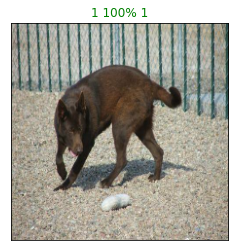

In [56]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=15)

In [57]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    """
    Plus the top 10 highest prediction confidences along with the truth label for sample n.
    """
    pred_prob, true_label = prediction_probabilities[n], labels[n]

    # Get the predicted label
    pred_label = make_prediction(pred_prob)

    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    # Find the top 10 prediction confidence values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_category[top_10_pred_indexes]

    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

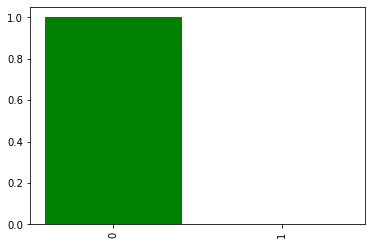

In [58]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

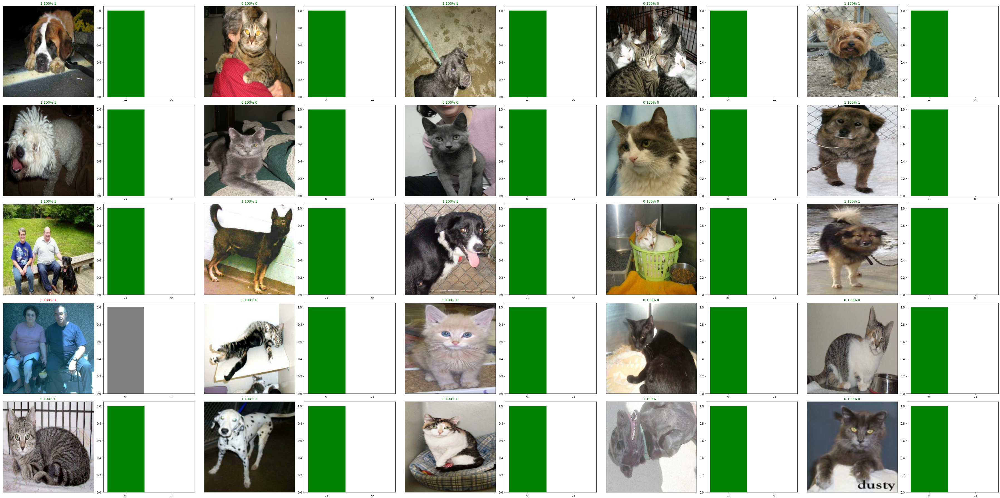

In [59]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 5
num_cols = 5
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
              labels=val_labels,
              images=val_images,
              n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                   labels=val_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [64]:
# Create a function to save a model
def save_model(model, suffix=None):
    """
    Saves a given model in a models directory and appends a suffix (string).
    """
    # Create a model directory pathname with current time
    modeldir = "Dog_vs_cat/model/"
    model_path = modeldir + "-" + suffix + ".h5" # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [65]:
# Save our model trained on 1000 images
save_model(model, suffix="mobilenetv2-Adam")

Saving model to: Dog_vs_cat/model/-mobilenetv2-Adam.h5...


C:\Users\DELL\anaconda3\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


'Dog_vs_cat/model/-mobilenetv2-Adam.h5'

In [66]:
# Evaluate the pre-saved model
model.evaluate(val_data)

157/157 [==============================] - 11s 67ms/step - loss: 0.0684 - accuracy: 0.9860


[0.06836580485105515, 0.9860000014305115]

In [67]:
def test_data(path):
    demo = imread(path)
    demo = tf.image.convert_image_dtype(demo,tf.float32)
    demo = tf.image.resize(demo,size=[224,224])
    demo = np.expand_dims(demo,axis=0)

    pred = model.predict(demo)
    result = unique_category[np.argmax(pred)]

    return result

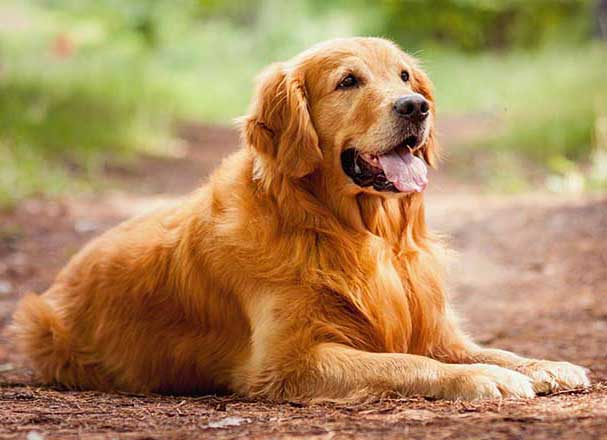

In [73]:
path = 'try/GOLDENRETRIEVER.jpg'
Image(path)


In [74]:
print(test_data(path))

1


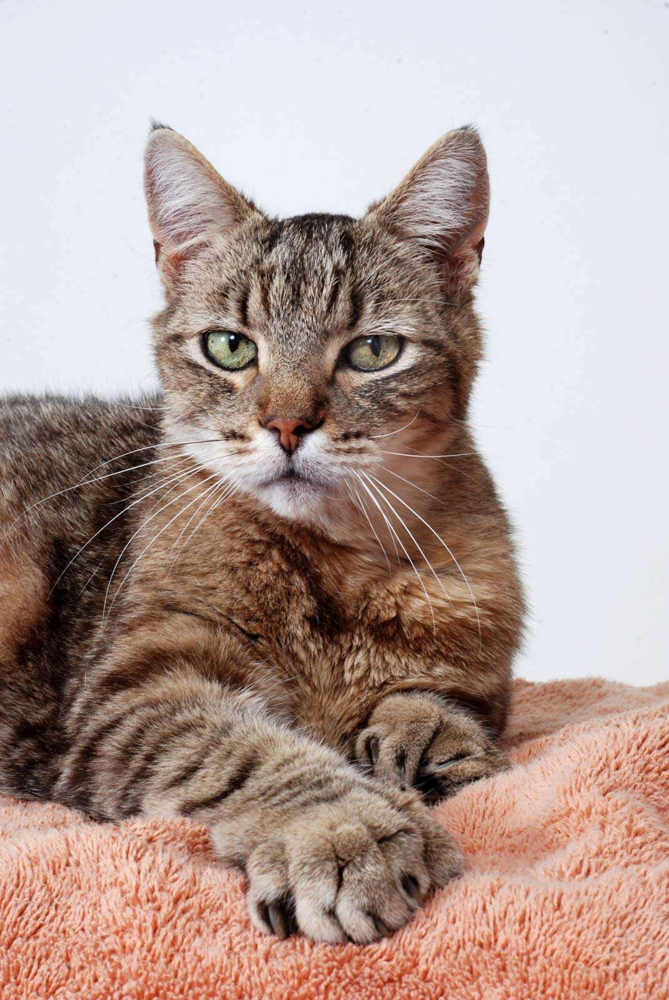

In [75]:
path = 'try/cat-toes-paw-number-paws-tiger-tabby.jpg'
Image(path)


In [76]:
print(test_data(path))

0
